In [1]:
from anndata import read_h5ad
import pandas as pd
import numpy as np
import scvi
import scanpy as sc

%load_ext nb_black
use_cuda = True


In [2]:
import matplotlib.pyplot as plt

%matplotlib inline

In [3]:
data_path = "../TabulaSapiensData/"

In [4]:
adata = read_h5ad(data_path + "decontX/Pilot1_Pilot2.decontX.h5ad")

/data/yosef2/users/chenling/miniconda3/envs/scvi-tools/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/data/yosef2/users/chenling/miniconda3/envs/scvi-tools/lib/python3.8/site-packages/numba/np/ufunc/parallel.py:363: NumbaWarning: The TBB threading layer requires TBB version 2019.5 or later i.e., TBB_INTERFACE_VERSION >= 11005. Found TBB_INTERFACE_VERSION = 9002. The TBB threading layer is disabled.
  warnings.warn(problem)
/data/yosef2/users/chenling/miniconda3/envs/scvi-tools/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


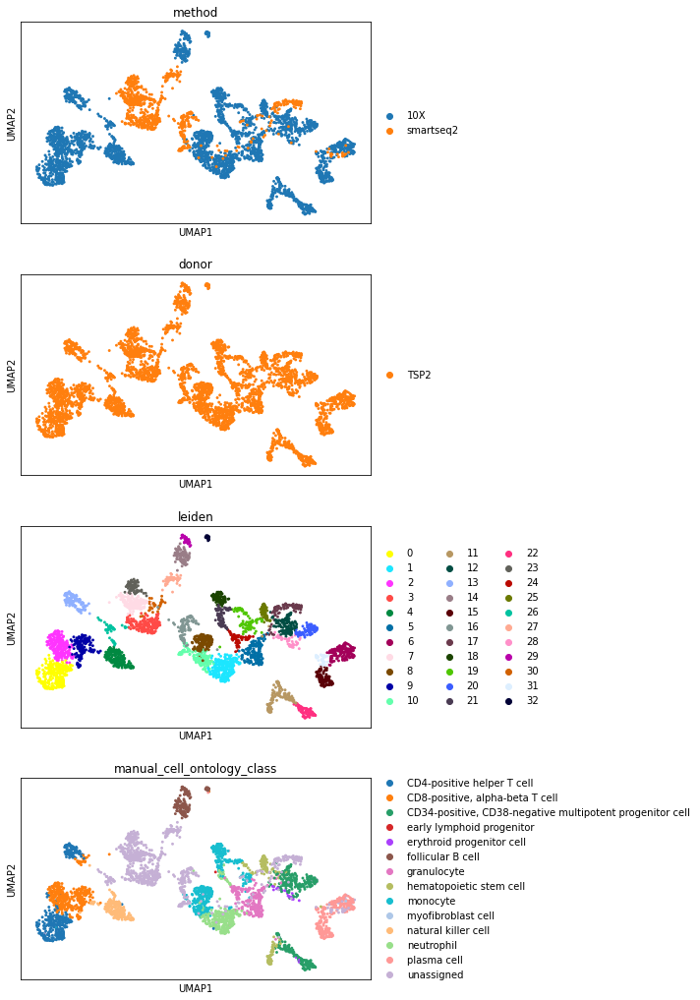

In [5]:
organ = "Bone_Marrow"
organ_adata = adata[adata.obs["tissue"] == organ]
sc.pp.neighbors(organ_adata, use_rep="X_scvi_decontX")
sc.tl.umap(organ_adata)
organ_adata.obsm["X_umap_decontX"] = organ_adata.obsm["X_umap"].copy()
sc.tl.leiden(organ_adata, resolution=2)
sc.pl.umap(
    organ_adata,
    color=["method", "donor", "leiden", "manual_cell_ontology_class"],
    ncols=1,
)
organ_adata.X = np.log1p(organ_adata.X)

# cluster to celltype correspondance
count is a matrix of cluster-cell type correspondance, where each row is a celltype, and each colum is a cluster. The entries to the matrix is the number of cells that is annotated as celltype *X* and cluster *Y*

In [6]:
count = {}
for c in np.unique(organ_adata.obs["leiden"]):
    count[c] = {}
    for t in np.unique(organ_adata.obs["manual_cell_ontology_class"]):
        count[c][t] = np.sum(
            (organ_adata.obs["leiden"].astype(str) == c)
            & (organ_adata.obs["manual_cell_ontology_class"] == t)
        )

count = pd.DataFrame.from_dict(count)

We can visualize the cluster assignment of each cell type through this heatmap. The color is normalized for each celltype 

<AxesSubplot:>

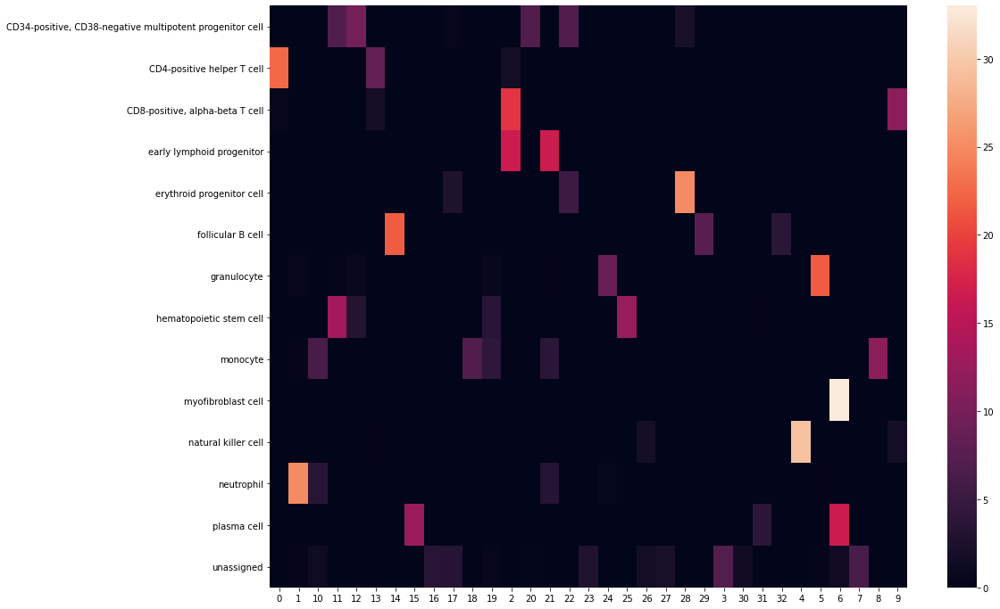

In [7]:
import seaborn

plt.figure(figsize=(16, 12))
seaborn.heatmap((count.T / count.mean(axis=1)).T)

# dictionary of cell type composition of each cluster 
What are clusters previously annotated as 

In [8]:
cluster_composition = {}
for x in count.columns.values:
    t = count.index[count[x] > 0].values
    freq = np.asarray([count.loc[y, x] for y in t]) / count[x].sum()
    res = [a + ": %.2f" % b for a, b in zip(t, freq)]
    cluster_composition[x] = res

In [9]:
cluster_composition["0"]

['CD4-positive helper T cell: 0.97',
 'CD8-positive, alpha-beta T cell: 0.02',
 'monocyte: 0.00',
 'unassigned: 0.00']

# Reassign pure clusters
If a cluster is very pure (>95% of annotated cells come from the same celltype, we reassign the clusters to all have the same labels) 

In [10]:
def Purity(x):
    names = x.index
    x = np.asarray(x).ravel()
    x = x[names != "unassigned"]
    return (np.max(x) / np.sum(x), names[np.argmax(x)])

In [11]:
cluster_purity = count.apply(Purity, axis=0).T
confident_clusters = cluster_purity[cluster_purity[0] > 0.95].index

<ipython-input-1-963029a66ab7>:5: RuntimeWarning: invalid value encountered in long_scalars
  return (np.max(x) / np.sum(x), names[np.argmax(x)])


In [12]:
for i in confident_clusters:
    organ_adata.obs.loc[
        organ_adata.obs["leiden"] == i, "new_manual_cell_ontology_class"
    ] = cluster_purity.loc[i, 1]

/data/yosef2/users/chenling/miniconda3/envs/scvi-tools/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
... storing 'new_manual_cell_ontology_class' as categorical


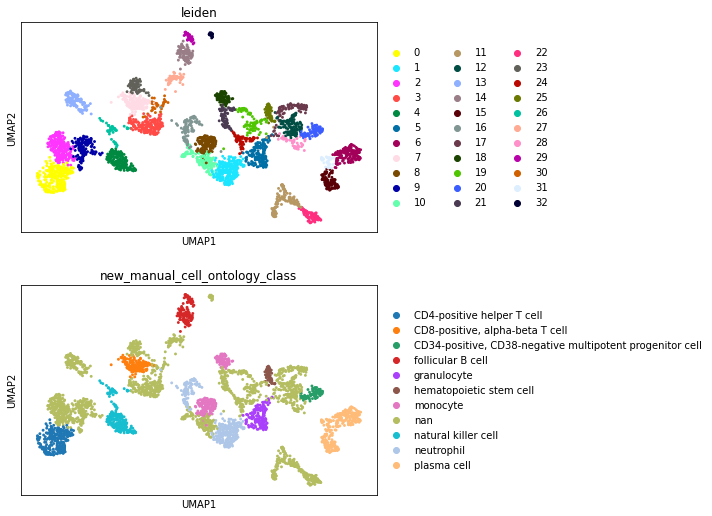

In [13]:
sc.pl.umap(
    organ_adata,
    color=["leiden", "new_manual_cell_ontology_class"],
    ncols=1,
)

# Sankey Diagram between cluster and cell types

In [14]:
from utils.colorDict import donor_colors, method_colors, compartment_colors, tissue_colors

In [15]:
from utils.plotting_utils import *
from utils.colorDict import compartment_colors

import plotly
import chart_studio.plotly as py
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot

import plotly.io as pio

pio.renderers.default = "notebook"

init_notebook_mode(connected=True)

In [16]:
df = pd.DataFrame(columns=["celltype", "compartment", "count"])
for t in np.unique(organ_adata.obs["manual_cell_ontology_class"]):
    for c in np.unique(organ_adata.obs["compartment_pred_svm"]):
        x = np.sum(
            (organ_adata.obs["compartment_pred_svm"].astype(str) == c)
            & (organ_adata.obs["manual_cell_ontology_class"] == t)
        )
        df = df.append(
            pd.DataFrame([t, c, x], index=["celltype", "compartment", "count"]).T,
            ignore_index=True,
        )


fig = genSankey(
    df,
    cat_cols_color=[compartment_colors(), "#00A1E0"],
    cat_cols=["compartment", "celltype"],
    value_cols="count",
    title="celltype-compartment",
)
iplot(fig, validate=False)
plotly.offline.plot(
    fig, validate=False, filename="figures/celltype_sankey_%s" % organ + ".html"
)  # , output_type='div')

'figures/celltype_sankey_Bone_Marrow.html'

# visualize compartment markers

In [17]:
compartment_markers = {
    "Epithelial": ["CDH1", "CLDN4", "EPCAM"],
    "Endothelial": ["CA4", "CDH5", "CLDN5", "PECAM1", "VWF"],
    "Stromal": ["BGN", "DCN", "COL1A2"],
    "Immune": ["LCP1", "PTPRC", "RAC2"],
}

In [18]:
for x in compartment_markers.keys():
    sc.tl.score_genes(organ_adata, compartment_markers[x], score_name="%s_score" % x)

/data/yosef2/users/chenling/miniconda3/envs/scvi-tools/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning:

is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead

/data/yosef2/users/chenling/miniconda3/envs/scvi-tools/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning:

is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead

/data/yosef2/users/chenling/miniconda3/envs/scvi-tools/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning:

is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead

/data/yosef2/users/chenling/miniconda3/envs/scvi-tools/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning:

is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead



/data/yosef2/users/chenling/miniconda3/envs/scvi-tools/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning:

is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead



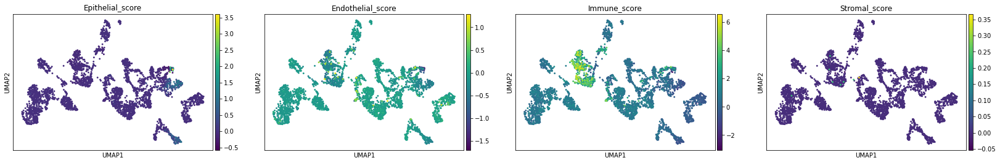

In [19]:
sc.pl.umap(
    organ_adata,
    color=["Epithelial_score", "Endothelial_score", "Immune_score", "Stromal_score"],
)

# Find markers for each cluster

In [20]:
sc.tl.rank_genes_groups(organ_adata, groupby="leiden", method="wilcoxon")

In [21]:
def FormatDE(res):
    groups = res['scores'].dtype.names
    df_res = {}
    for group in groups:
        df = pd.DataFrame([res['scores'][group],
                           res['logfoldchanges'][group],res['pvals_adj'][group]], 
                           columns=res['names'][group],
                           index=['wilcoxon_score','log fold change','adjusted pvalue'])
        df_res[group] = df
    return df_res


In [22]:
DE = FormatDE(organ_adata.uns["rank_genes_groups"])

### top positive marker genes

In [23]:
for x in DE.keys():
    print(x)
    display(DE[x].T[:20])

0


,wilcoxon_score,log fold change,adjusted pvalue
CD3E,20.258535,2.961724,1.758577e-86
LTB,19.989702,3.109789,1.992736e-84
IL7R,19.878288,3.338770,1.231150e-83
TRAC,19.670971,2.418397,5.627856e-82
CD3D,19.235001,2.287688,2.219884e-78
CD3G,19.221514,1.906546,2.399257e-78
BCL11B,18.214270,2.960725,3.344547e-70
IL32,17.582415,2.382239,2.472260e-65
TCF7,15.037300,2.853202,2.462337e-47
BTG1,14.913832,1.389076,1.433895e-46


1


,wilcoxon_score,log fold change,adjusted pvalue
S100A12,24.014259,5.743329,1.161807e-122
S100A9,23.663576,7.161621,2.518474e-119
S100A8,23.242645,7.122330,3.312969e-115
VCAN,22.872631,4.861598,1.280775e-111
MNDA,22.858768,4.551652,1.407627e-111
LYZ,21.346033,5.586290,4.164815e-97
AC020656.1,21.077208,4.448004,1.082884e-94
FCN1,20.882326,3.769763,5.704904e-93
LGALS1,20.860229,4.096433,8.050886e-93
CYBB,20.474808,3.366393,2.126198e-89


2


,wilcoxon_score,log fold change,adjusted pvalue
IL7R,18.986609,3.252215,1.295681e-75
GZMA,17.227427,2.471577,3.244581e-62
CCL5,16.969913,2.625174,1.614630e-60
LYAR,16.830009,1.914252,1.236934e-59
CD3D,16.416317,1.794710,1.075668e-56
CD3E,16.239948,2.243183,1.721255e-55
CD2,16.200541,1.654362,2.942680e-55
TRAC,15.299968,1.320496,2.468744e-49
FGFBP2,14.392923,1.613430,1.205170e-43
CD3G,14.253990,1.036452,8.040133e-43


3


,wilcoxon_score,log fold change,adjusted pvalue
KLRD1,21.216425,8.123025,2.436559e-95
TMSB4X,21.206726,7.531276,2.436559e-95
GNLY,20.913635,10.864116,7.895854e-93
TMSB4XP4,20.856871,5.660789,1.943228e-92
B2M,20.787550,6.602678,6.605559e-92
TMSB4XP8,20.621058,7.814665,1.742852e-90
PFN1,20.604368,7.045324,2.108956e-90
MT-CO2,20.391834,6.540529,1.454061e-88
TMSB4XP1,20.136698,6.409585,2.302710e-86
MALAT1,19.859383,5.943715,5.382351e-84


4


,wilcoxon_score,log fold change,adjusted pvalue
CD7,18.733326,3.599652,7.795577e-74
PRF1,17.767937,2.774355,6.701219e-67
NKG7,17.683477,3.321032,2.545855e-66
KLRD1,17.630177,3.267045,6.076842e-66
CLIC3,17.275282,3.243203,1.932542e-63
GNLY,17.021536,3.997715,1.195464e-61
CD247,16.956291,2.307069,3.181180e-61
GZMB,16.833702,2.470372,2.324246e-60
KLRB1,16.023468,2.513121,1.052740e-54
CST7,15.840605,1.865403,1.779648e-53


5


,wilcoxon_score,log fold change,adjusted pvalue
LYZ,19.548986,6.545660,2.477264e-80
AC020656.1,18.674429,5.455153,2.353044e-73
RNASE2,18.525761,4.187095,2.511457e-72
S100A8,17.770790,6.274267,1.751414e-66
MNDA,17.235620,3.965228,1.689627e-62
S100A9,17.069380,5.838647,2.461253e-61
LGALS1,16.634768,3.965453,3.282127e-58
CSTA,16.027969,3.257167,5.997668e-54
MS4A6A,15.664027,3.215840,1.743053e-51
MKI67,15.040577,4.114019,2.343423e-47


6


,wilcoxon_score,log fold change,adjusted pvalue
MZB1,20.420990,8.070462,6.407280e-88
DERL3,20.361963,7.416020,1.070603e-87
IGKC,20.219629,12.456110,1.290729e-86
PRDX4,19.412035,5.570103,8.986423e-80
SSR4,19.341658,5.491852,2.821586e-79
SPAG4,19.208675,6.903412,3.072593e-78
TNFRSF17,18.817537,6.962715,4.562238e-75
FKBP11,18.738464,5.243522,1.769569e-74
SEC11C,18.620987,5.258138,1.420543e-73
HERPUD1,17.835943,5.047473,2.188368e-67


7


,wilcoxon_score,log fold change,adjusted pvalue
MT-CO1,19.275898,6.505345,5.039421e-78
FP671120.5,18.954330,5.707408,1.197126e-75
EEF1A1P5,18.809227,6.113461,1.245244e-74
MT-ND5,18.710451,6.187743,5.487420e-74
ACTB,18.703217,6.471600,5.487420e-74
B2M,18.652540,6.158762,1.181496e-73
CCL5,18.531139,7.899000,9.739466e-73
TMSB4XP8,18.511786,7.267472,1.220901e-72
MALAT1,18.390345,5.757134,1.026800e-71
RPL13AP5,18.190063,5.495858,3.642218e-70


8


,wilcoxon_score,log fold change,adjusted pvalue
MS4A7,19.202129,5.189961,2.091238e-77
AIF1,18.899424,4.771205,3.394027e-75
LST1,18.828726,4.629017,8.618748e-75
SERPINA1,18.539562,4.509421,1.457383e-72
FGL2,17.878286,3.866281,2.049940e-67
CEBPD,17.402987,3.773597,7.683715e-64
TYROBP,17.380737,4.092577,9.710259e-64
CD163,17.197622,4.042379,2.035833e-62
CTSS,17.186377,3.658635,2.197031e-62
CLEC7A,16.862631,3.832530,4.988198e-60


9


,wilcoxon_score,log fold change,adjusted pvalue
GZMK,15.122567,4.696218,6.768414e-47
CCL5,14.534230,3.440962,2.164514e-43
CD3E,14.215178,2.607951,1.447470e-41
CD3D,14.030480,2.263716,1.493271e-40
GZMA,13.476094,2.639190,2.546195e-37
IL32,13.379749,2.546637,7.791911e-37
TRAC,13.358137,1.929304,8.930468e-37
CCL4,13.183333,2.431289,8.053841e-36
TRGC2,12.844616,2.551778,6.031476e-34
CD2,12.816875,1.894664,7.765514e-34


10


,wilcoxon_score,log fold change,adjusted pvalue
CD163,18.008318,5.426728,9.869149e-68
CTSS,17.856174,4.951769,7.617147e-67
AIF1,17.053865,4.906888,6.420075e-61
CYBB,16.751198,4.213204,8.167961e-59
CST3,16.248440,4.332730,2.697683e-55
LST1,16.116861,4.212716,1.905695e-54
VCAN,15.970491,4.506780,1.688457e-53
TYROBP,15.963511,4.387491,1.688457e-53
MS4A6A,15.789846,4.588110,2.390569e-52
S100A11,15.779751,3.896699,2.524812e-52


11


,wilcoxon_score,log fold change,adjusted pvalue
EGFL7,15.653541,3.874387,1.849913e-50
SNHG7,15.558649,2.905810,4.091542e-50
NME2,15.375834,3.183713,4.665681e-49
SNHG29,14.601831,3.190107,4.023766e-44
PRSS57,13.815863,3.819761,2.407659e-39
CD82,13.376251,2.715495,8.167369e-37
HSP90AB1,13.290806,2.436819,2.028148e-36
IGFBP7,13.286942,2.602510,2.028148e-36
PCBP2,13.222491,1.982466,4.256432e-36
EBPL,13.183275,2.382048,6.448063e-36


12


,wilcoxon_score,log fold change,adjusted pvalue
EBPL,17.140373,4.096557,4.366602e-61
GIHCG,16.879957,5.147770,1.860030e-59
CCNB1IP1,16.419611,3.892169,2.716892e-56
LYL1,16.387472,3.760364,3.458862e-56
SNHG7,16.363667,3.750053,4.092202e-56
PRSS57,16.157740,4.873861,9.828080e-55
CDK6,16.015739,3.994929,8.344490e-54
SNHG29,15.994357,4.353667,1.029451e-53
SNHG8,15.981572,3.263845,1.062460e-53
YBX3,15.978486,3.591554,1.062460e-53


13


,wilcoxon_score,log fold change,adjusted pvalue
CD3E,14.088204,2.877315,1.321121e-40
PTPRCAP,13.537952,5.243232,1.373959e-37
IFITM1,11.835471,1.448826,1.369551e-28
IL32,11.287612,2.143042,5.232006e-26
LTB,11.146763,2.218006,2.300863e-25
IL7R,10.710436,2.104390,2.327471e-23
LCK,9.609388,1.283838,1.130629e-18
CD3D,9.503684,1.242352,2.839689e-18
CD3G,7.965949,0.629043,1.322246e-12
AC024293.1,7.857894,1.154938,2.948359e-12


14


,wilcoxon_score,log fold change,adjusted pvalue
IGHM,16.841825,5.704649,7.091708e-59
AL139020.1,16.605999,5.765074,1.856194e-57
MS4A1,16.286469,5.039979,1.941312e-55
CD79A,16.282261,4.836308,1.941312e-55
IGHD,15.974000,4.641670,2.283451e-53
CD79B,14.485398,3.085240,1.470293e-43
IGKC,14.100680,3.760682,3.163217e-41
IGLC2,13.686502,3.291261,8.996416e-39
HLA-DQA1,13.651804,4.217004,1.288222e-38
BANK1,13.326147,3.869483,8.729114e-37


15


,wilcoxon_score,log fold change,adjusted pvalue
MZB1,15.755452,6.670277,3.709229e-51
DERL3,15.624235,5.815936,1.465459e-50
TNFRSF17,15.262192,5.008528,2.680200e-48
PRDX4,15.077317,4.508074,2.688742e-47
SPAG4,15.023025,5.455056,5.090769e-47
ITM2C,14.999660,4.385479,6.206322e-47
SEC11C,14.741907,4.163748,2.552363e-45
IGHG1,14.687518,7.900703,5.069405e-45
POU2AF1,14.617861,4.728109,1.060070e-44
GAS6,14.586837,4.535722,1.542523e-44


16


,wilcoxon_score,log fold change,adjusted pvalue
AL512646.1,12.475270,4.638312,2.398591e-32
S100A9,11.116341,5.455920,1.138914e-25
S100A8,10.146654,5.014762,2.013474e-21
MT-RNR2,8.202019,1.954697,5.750361e-14
GRK2,6.488845,2.560245,1.028700e-08
SNORD3A,6.420735,2.529142,1.556300e-08
CTSD,5.940695,2.813662,2.690540e-07
CYBB,5.845300,2.270045,4.555867e-07
RNASE2,5.489013,2.289062,3.189605e-06
GRN,5.381917,1.997037,5.605331e-06


17


,wilcoxon_score,log fold change,adjusted pvalue
RPS25,15.074375,5.814403,1.405614e-46
RPS23,14.972557,4.909956,3.266450e-46
RPL23,14.940529,6.539092,3.523268e-46
RPL27A,14.859994,6.404004,6.076569e-46
RPL31,14.849197,6.577461,6.076569e-46
MT-CO3,14.845634,7.456996,6.076569e-46
RPL34,14.838608,4.479764,6.076569e-46
RPS18,14.837729,7.019314,6.076569e-46
RPS17,14.830601,6.511169,6.076569e-46
RPS12,14.790927,4.932350,9.868295e-46


18


,wilcoxon_score,log fold change,adjusted pvalue
IFITM3,13.497726,4.001661,9.494390e-37
ATP6V0C,12.961896,3.718410,5.922666e-34
SERPINA1,12.577877,3.568084,5.483546e-32
LST1,12.523912,3.486704,8.130462e-32
MS4A7,12.201902,3.556996,3.575131e-30
SMIM25,12.004746,3.805905,3.291704e-29
GABARAP,11.693916,2.335747,1.151530e-27
AIF1,11.615399,3.178869,2.532721e-27
TYROBP,11.213408,2.948047,2.062994e-25
CALHM6,11.175430,2.698752,2.878701e-25


19


,wilcoxon_score,log fold change,adjusted pvalue
HLA-DRA,13.595066,5.164596,2.521834e-37
NAPSB,13.475081,6.763693,6.453435e-37
HLA-DPB1,13.261365,4.392130,7.609377e-36
HLA-DPA1,13.149027,4.697917,2.536996e-35
HLA-DQB1,13.040805,5.119172,8.441501e-35
HLA-DRB1,12.887508,4.179516,5.192917e-34
HLA-DMA,12.570758,3.586416,2.571606e-32
CD74,12.507985,4.868712,4.968285e-32
LSP1,12.163109,2.976640,3.196190e-30
GSN,11.877102,3.530403,9.164328e-29


20


,wilcoxon_score,log fold change,adjusted pvalue
HBB,14.865790,11.636796,2.191127e-45
AHSP,14.845463,9.088469,2.191127e-45
HBA1,14.811053,10.221863,2.438742e-45
PRKAR2B,14.757850,5.915707,4.030718e-45
CA1,14.629637,9.482028,2.139981e-44
GLRX5,14.606898,5.442375,2.490334e-44
SYNGR1,14.591611,6.448316,2.671078e-44
HBD,14.553695,7.349164,4.071725e-44
SMIM1,14.539997,5.852747,4.421502e-44
FAM178B,14.516327,7.288385,5.621603e-44


21


,wilcoxon_score,log fold change,adjusted pvalue
S100A8,10.057940,4.495797,2.494713e-19
IFI30,9.345877,3.361712,1.072985e-16
GABARAP,9.291895,1.754294,1.487106e-16
CST3,9.033460,2.602855,1.223973e-15
S100A9,8.776677,3.036331,7.624795e-15
CSTA,8.528167,2.130750,5.835407e-14
VCAN,8.418495,2.290776,1.403132e-13
ATP6V0C,8.406034,2.405737,1.444933e-13
LYZ,8.401237,2.876922,1.444933e-13
FCN1,8.356850,2.329694,1.995852e-13


22


,wilcoxon_score,log fold change,adjusted pvalue
HBB,13.994226,9.745970,9.642831e-40
AHSP,13.929875,7.699699,9.642831e-40
FAM178B,13.918159,6.394809,9.642831e-40
CA2,13.832697,6.004337,2.381828e-39
KLF1,13.772421,5.639610,4.397402e-39
CA1,13.674677,8.538656,1.365790e-38
HBD,13.665848,6.567537,1.365790e-38
GSTM3,13.631380,6.792511,1.917724e-38
KCNH2,13.547333,5.797571,5.374272e-38
HEBP1,13.472455,4.782943,1.337444e-37


23


,wilcoxon_score,log fold change,adjusted pvalue
EEF1A1P5,13.781787,7.436559,1.931221e-38
EEF1A1,13.601385,6.076054,1.156561e-37
EEF1A1P6,13.536654,6.121685,1.864579e-37
RPL13AP5,13.411012,6.539586,7.671216e-37
RPS3AP26,13.297904,5.658422,2.802782e-36
RPL13A,13.263716,6.823694,3.214366e-36
RPS2P5,13.260182,7.096754,3.214366e-36
RPL23,13.252433,5.809696,3.214366e-36
RPL10P16,13.209811,5.572324,4.920163e-36
FP671120.5,13.203657,5.943143,4.920163e-36


24


,wilcoxon_score,log fold change,adjusted pvalue
CSTA,10.013053,2.794105,3.899615e-19
LYZ,9.973681,4.575562,3.899615e-19
S100A8,9.937675,5.328975,4.200545e-19
RNASE2,9.556417,2.698220,1.025216e-17
CAPG,9.457546,2.658303,2.319883e-17
LGALS1,8.530107,2.828346,8.607487e-14
NME2,8.435487,2.220524,1.765178e-13
AZU1,8.317431,4.086556,4.409843e-13
H2AFZ,8.262891,1.689865,6.438868e-13
S100A9,8.102454,3.543194,2.264876e-12


25


,wilcoxon_score,log fold change,adjusted pvalue
SPINK2,11.973569,5.223826,2.877571e-28
AVP,11.406882,6.064275,1.137159e-25
SNHG7,11.054994,3.562564,4.068936e-24
SOCS2,10.861757,4.231941,2.580610e-23
EGFL7,10.532987,3.842092,7.167062e-22
CRHBP,10.480145,5.308791,1.045740e-21
NRIP1,9.972095,3.388506,1.698171e-19
AC011139.1,9.835254,6.741560,5.840464e-19
SNHG8,9.809705,2.677570,6.689440e-19
BST2,9.692242,2.202152,1.915087e-18


26


,wilcoxon_score,log fold change,adjusted pvalue
MKI67,9.295910,4.825758,8.592249e-16
GZMA,9.142463,3.801754,1.796883e-15
PRF1,8.773724,3.036271,3.391951e-14
FGFBP2,8.575949,2.680229,1.446342e-13
ASPM,8.541448,4.978223,1.560646e-13
STMN1,8.506547,4.284188,1.598216e-13
KLRD1,8.499726,3.074268,1.598216e-13
RRM2,8.415348,4.748698,2.882648e-13
CD247,8.400972,2.121337,2.896373e-13
NKG7,8.302955,3.246605,5.795071e-13


27


,wilcoxon_score,log fold change,adjusted pvalue
CD74,11.864315,9.523817,1.067794e-27
MS4A1,11.378434,12.105589,1.576315e-25
AC079250.1,10.930465,5.152151,1.617459e-23
RPL21,10.806236,5.122658,4.733065e-23
RPL18A,10.702869,4.264820,1.089020e-22
RPL18AP3,10.677863,5.384130,1.089020e-22
CD52,10.677663,7.819484,1.089020e-22
RPS27,10.620028,4.951180,1.769694e-22
MT-ND6,10.600237,6.700811,1.944182e-22
HLA-DRA,10.580580,7.232745,2.158650e-22


28


,wilcoxon_score,log fold change,adjusted pvalue
CA1,8.057922,3.734671,2.855264e-12
TFRC,7.107387,2.973496,3.026968e-09
AHSP,6.956732,3.534870,7.069592e-09
HBB,6.933426,4.023560,8.060636e-09
SLC25A37,6.827279,2.839602,1.643431e-08
ANK1,6.212029,3.103132,6.037598e-07
CD36,6.177833,2.542698,7.357338e-07
CA2,6.129188,3.076142,9.454397e-07
HNRNPAB,5.865344,1.684188,4.059347e-06
KCNH2,5.698499,2.823600,1.046389e-05


29


,wilcoxon_score,log fold change,adjusted pvalue
MS4A1,10.107781,5.699730,3.003942e-19
CD79A,10.013640,5.592122,3.908244e-19
HLA-DQA1,9.723331,5.111554,4.705744e-18
BANK1,9.595469,4.719422,1.229454e-17
TNFRSF13C,8.639848,4.453108,6.335010e-14
CD79B,8.624158,3.242314,6.335010e-14
HLA-DRA,8.291931,3.640805,9.370812e-13
IGKC,8.193340,3.329185,1.869673e-12
BLK,8.108723,5.109553,3.346095e-12
HLA-DPA1,7.971725,2.949157,9.211628e-12


30


,wilcoxon_score,log fold change,adjusted pvalue
AC005912.1,6.984419,3.717110,8.016286e-08
RPS27,6.914504,3.127799,8.016286e-08
TMSB4XP8,6.448833,4.781232,8.294365e-07
AC090498.1,6.328968,4.127497,1.614386e-06
MT-ATP8,6.291204,3.747387,1.685886e-06
MT-CO3,6.255044,3.221651,1.799622e-06
TMSB4XP4,6.223374,2.721920,1.909641e-06
MT-RNR2,6.198680,2.796090,2.075774e-06
MT-CO2,5.777668,3.325698,1.114749e-05
MTCO3P12,5.601438,2.289032,2.317526e-05


31


,wilcoxon_score,log fold change,adjusted pvalue
MZB1,8.466892,5.054685,4.636518e-14
IGKC,7.694130,7.472602,1.061596e-11
HERPUD1,7.357301,3.030974,1.115951e-10
RRBP1,7.231595,3.256774,2.509090e-10
IGHG1,6.949841,6.901473,1.679979e-09
BTG2,6.790988,3.455654,4.892710e-09
TENT5C,6.631625,3.292697,1.416337e-08
DERL3,6.572300,2.973038,2.053982e-08
XBP1,6.339842,2.425645,8.410016e-08
IGHG2,6.080187,5.164688,4.084916e-07


32


,wilcoxon_score,log fold change,adjusted pvalue
MS4A1,6.368849,4.432662,0.000007
CD79A,6.326776,3.845683,0.000007
HLA-DQA2,6.009724,5.676584,0.000036
BLK,5.898637,4.605891,0.000045
FCRLA,5.557436,4.632693,0.000230
PTPRCAP,5.451394,4.698582,0.000300
HLA-DQB1,5.441090,3.639560,0.000300
CD74,5.380234,3.124785,0.000337
CD79B,5.194016,2.242132,0.000808
HLA-DRB1,5.006189,2.514547,0.001720


### for cluster 0 plot the top marker genes

/data/yosef2/users/chenling/miniconda3/envs/scvi-tools/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning:

is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead



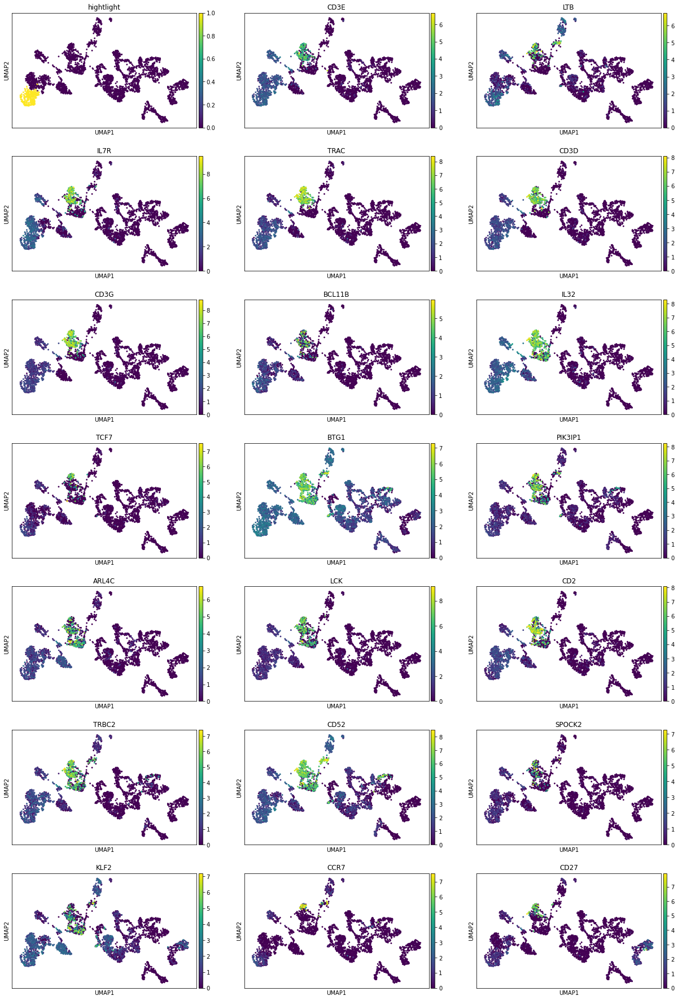

In [24]:
topgenes = list(DE["0"].T[:20].index)
organ_adata.obs["hightlight"] = organ_adata.obs["leiden"] == "0"
sc.pl.umap(
    organ_adata,
    color=["hightlight"] + topgenes,
    ncols=3,
)

You can do this for other clusters as well. Here I plot the top 5 genes for all other clusters

0


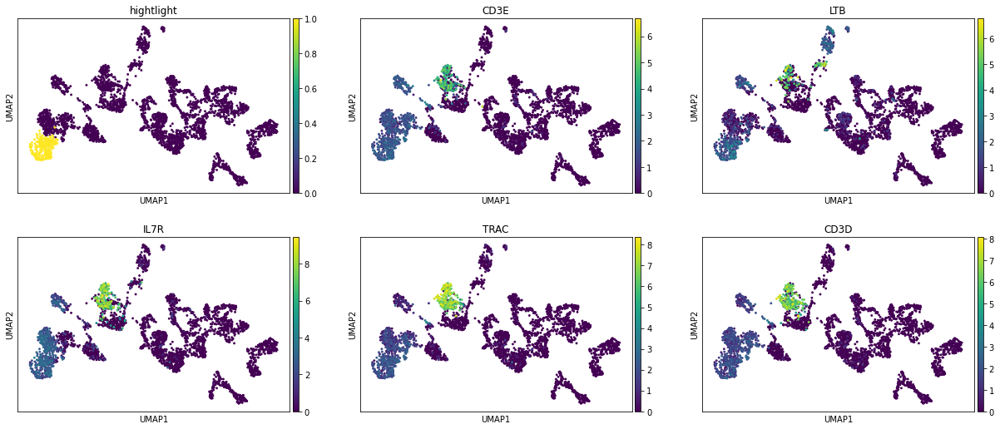

1


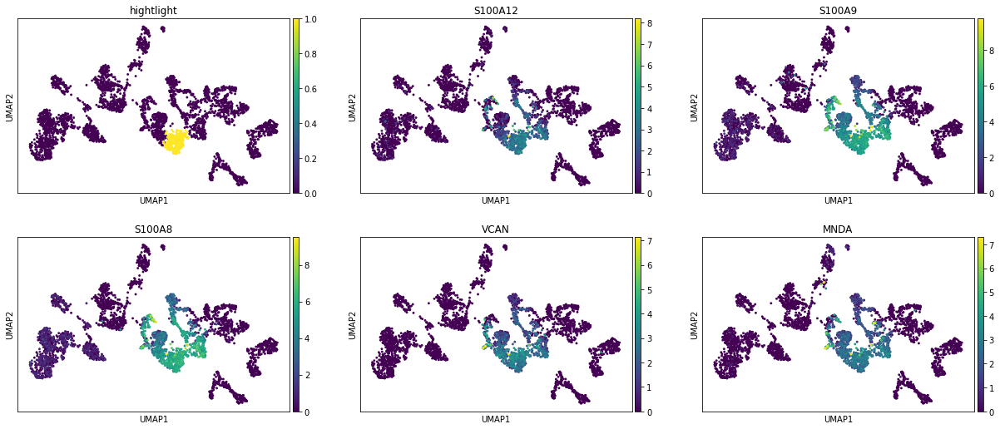

2


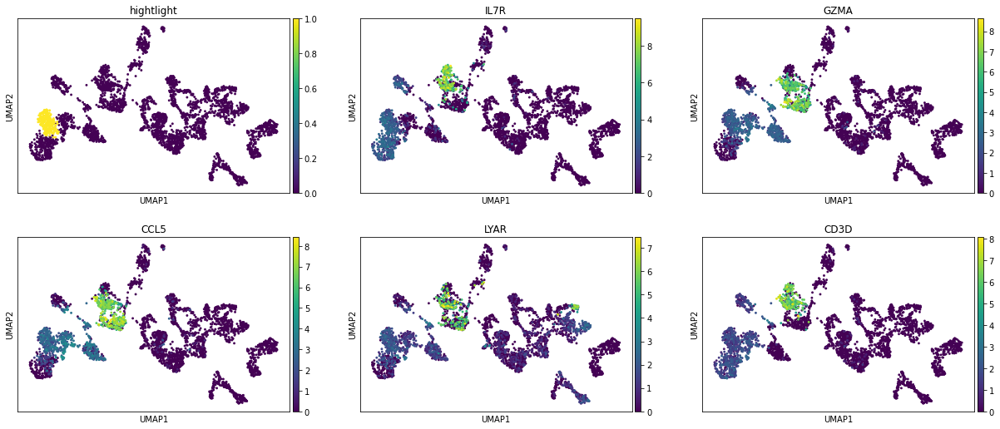

3


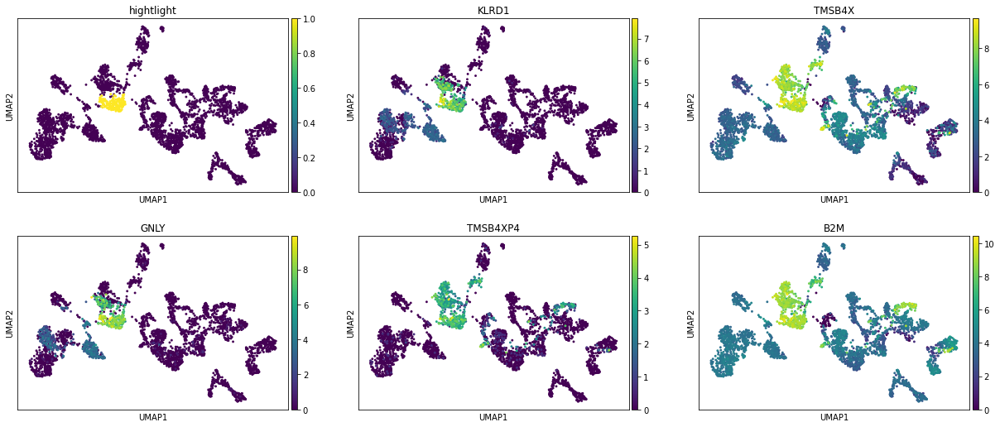

4


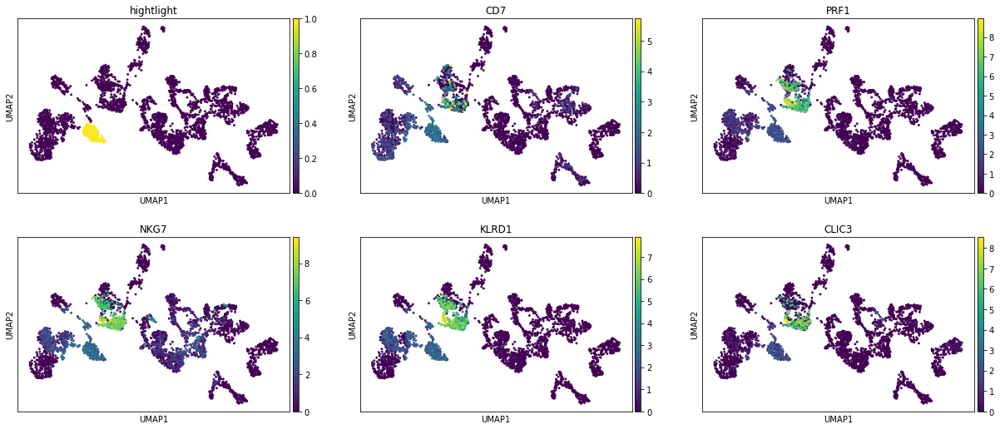

5


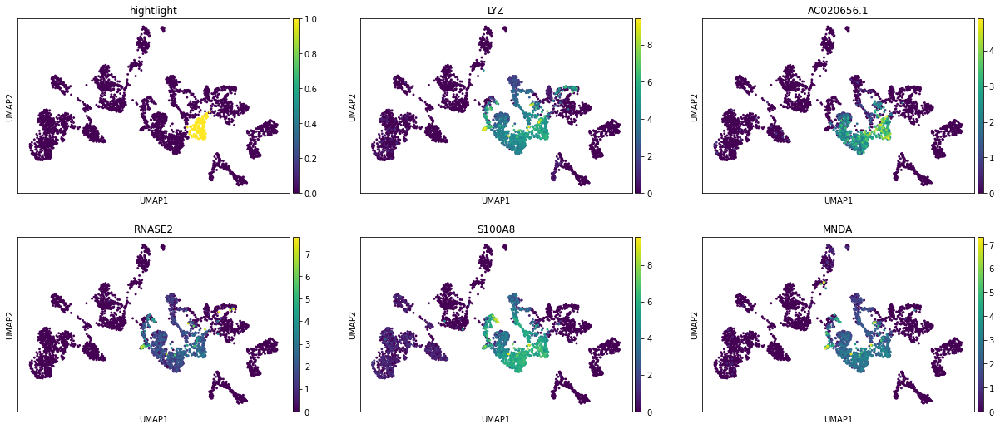

6


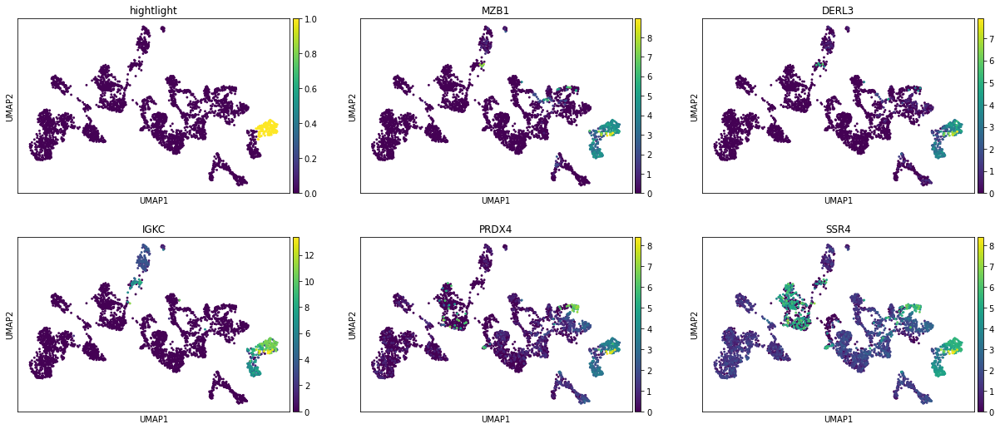

7


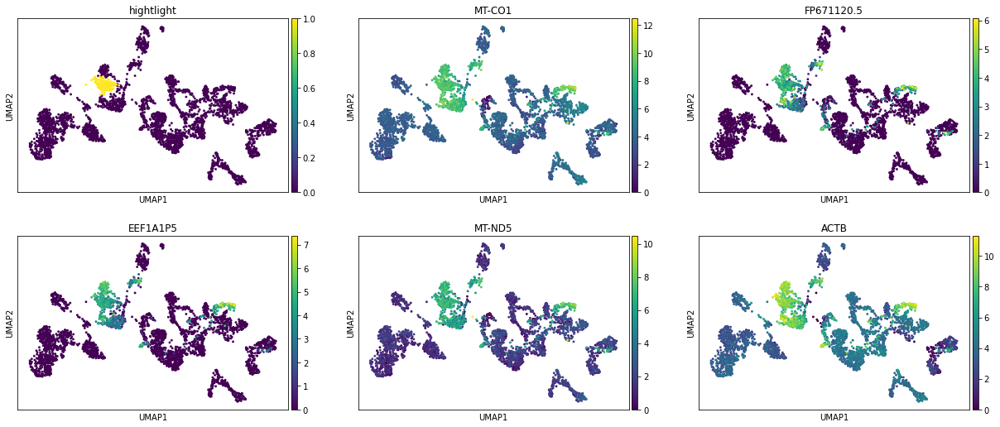

8


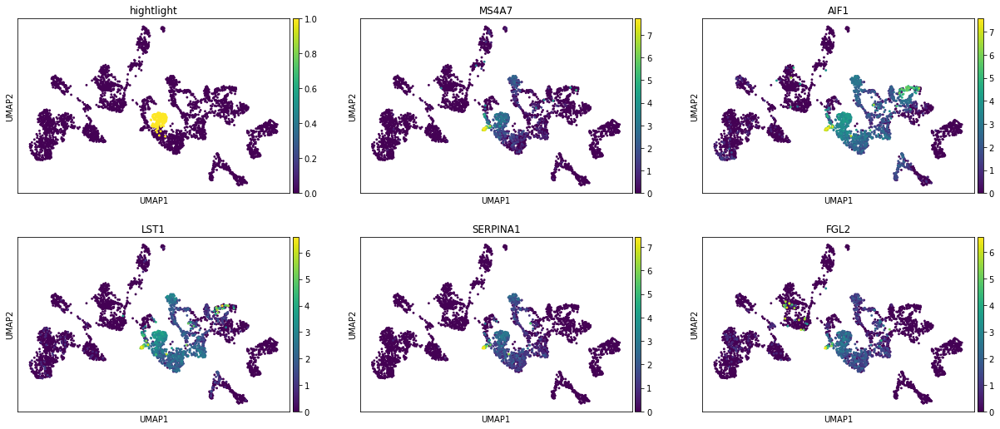

9


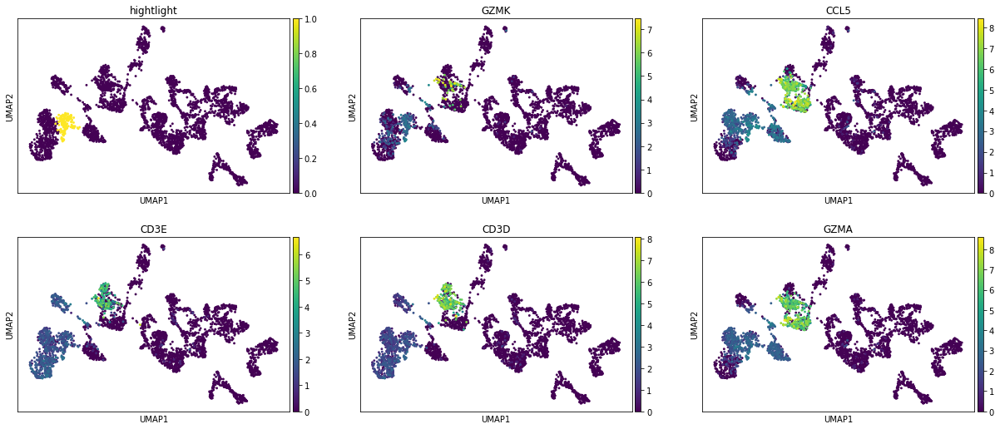

10


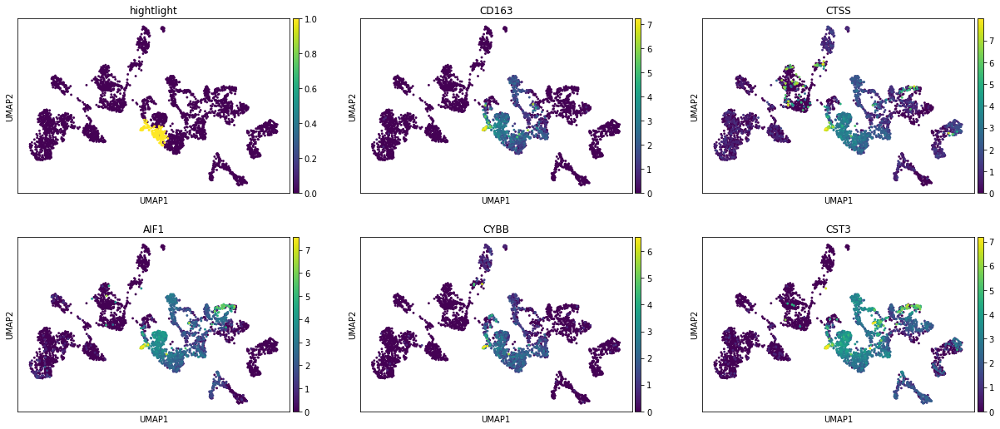

11


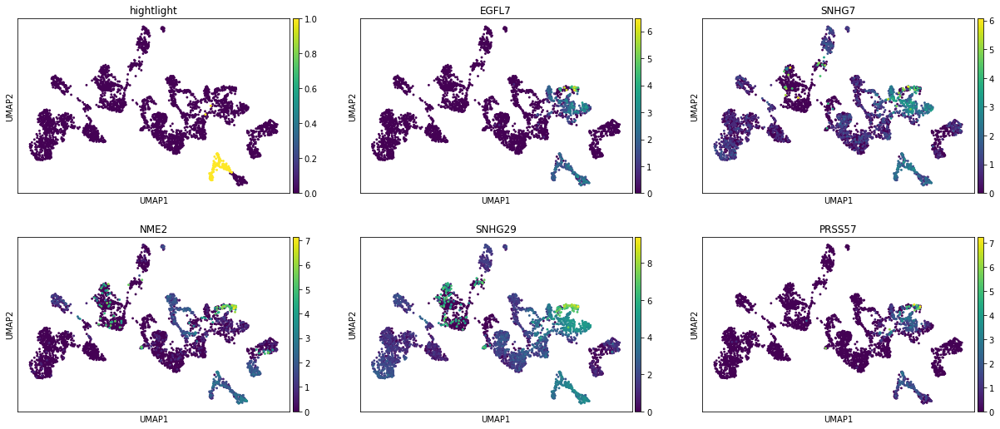

12


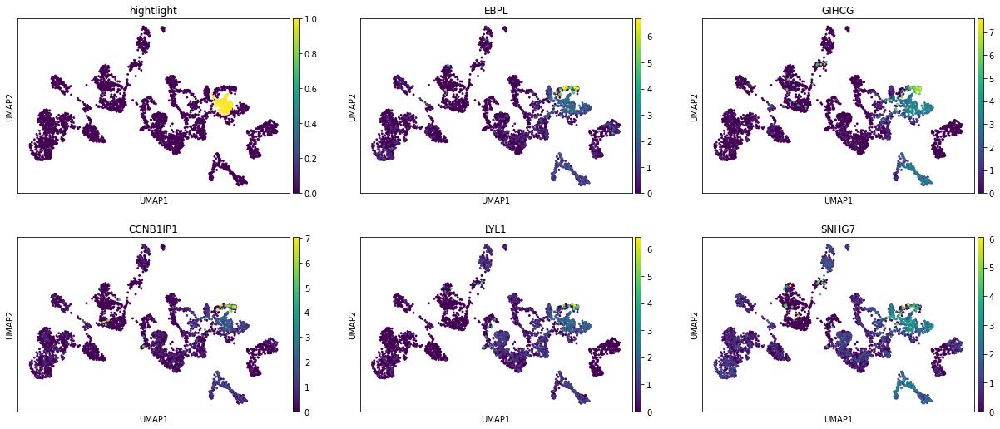

13


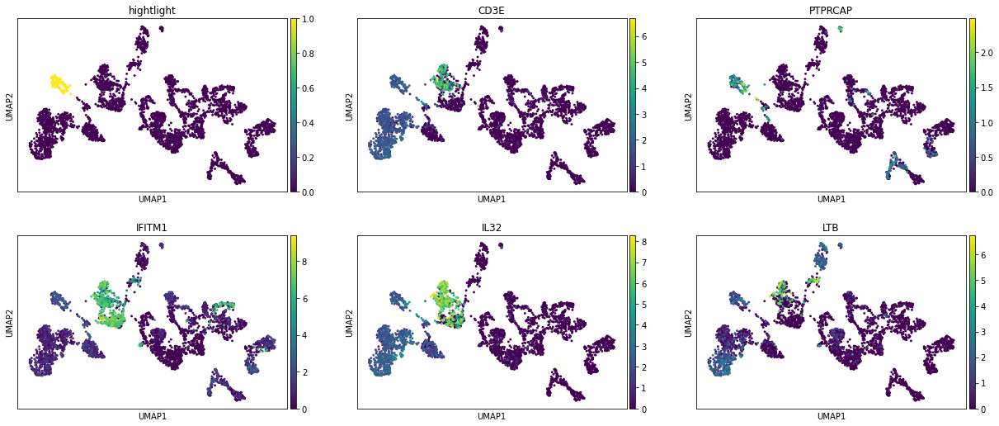

14


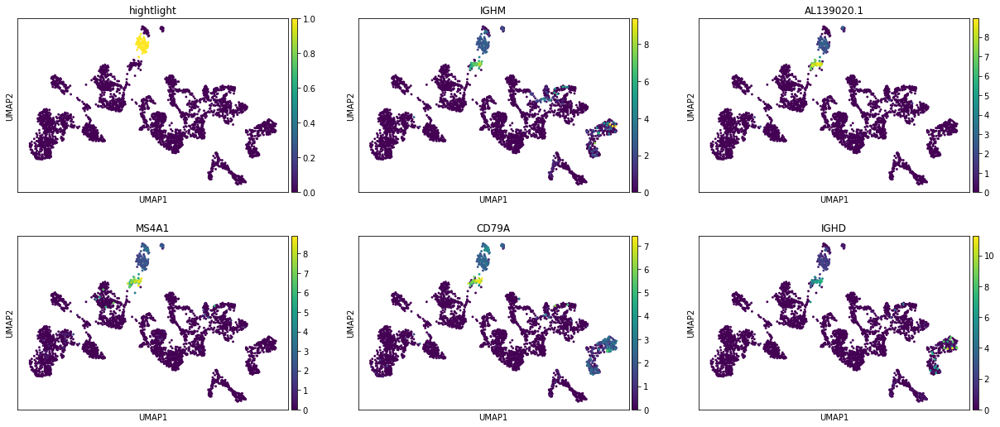

15


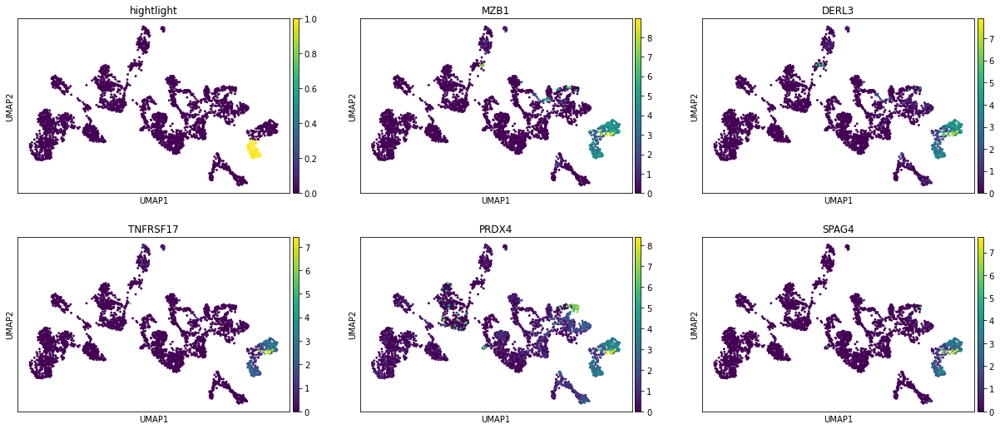

16


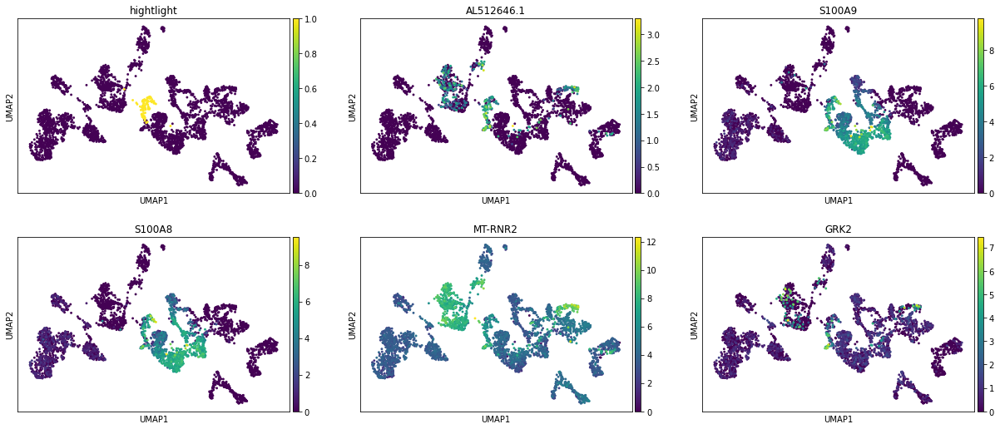

17


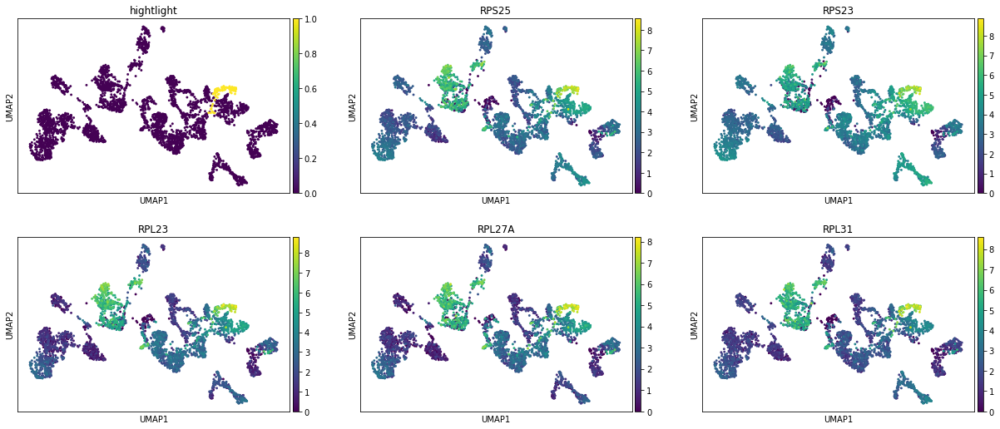

18


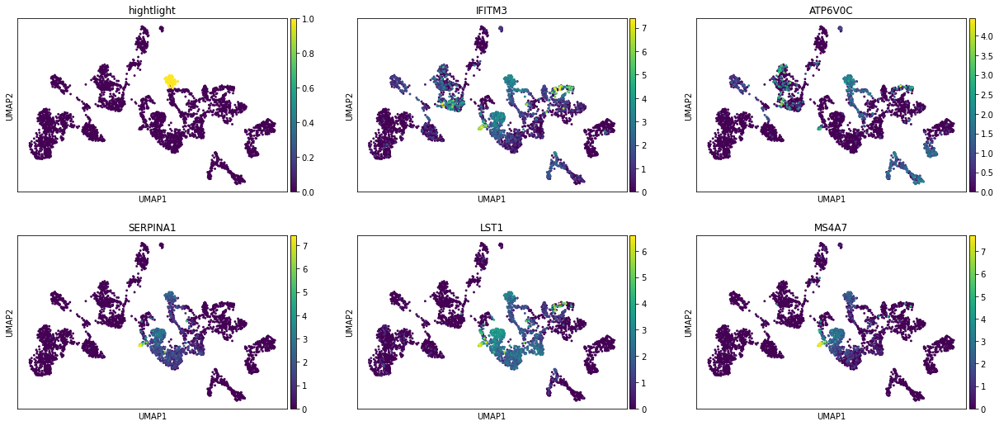

19


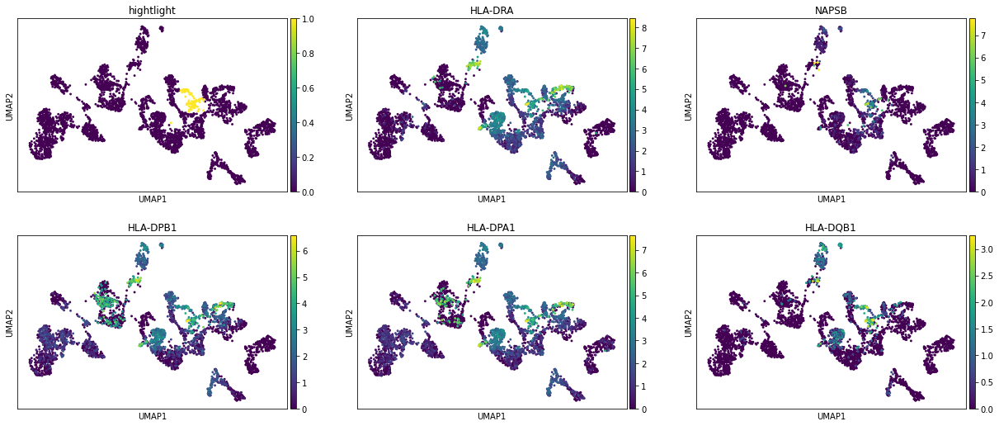

20


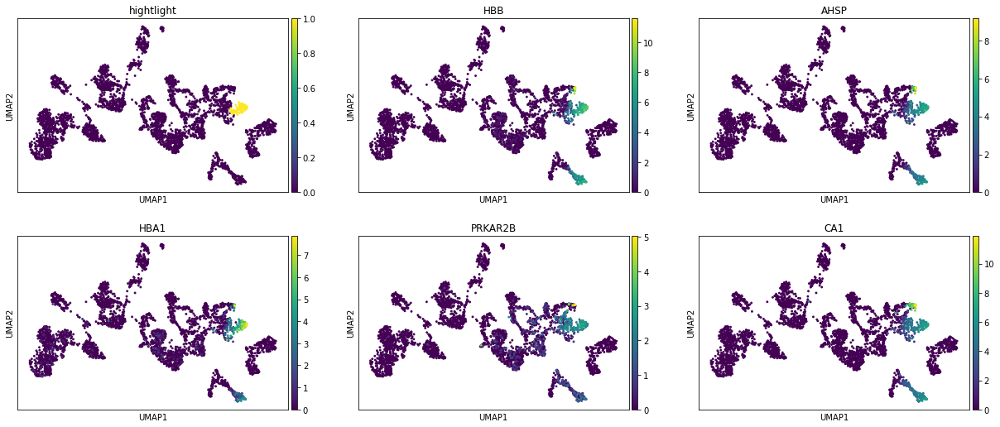

21


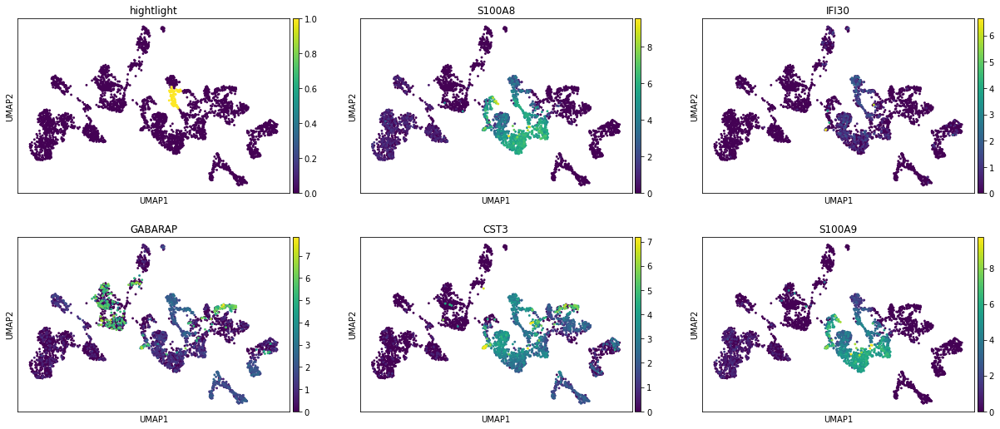

22


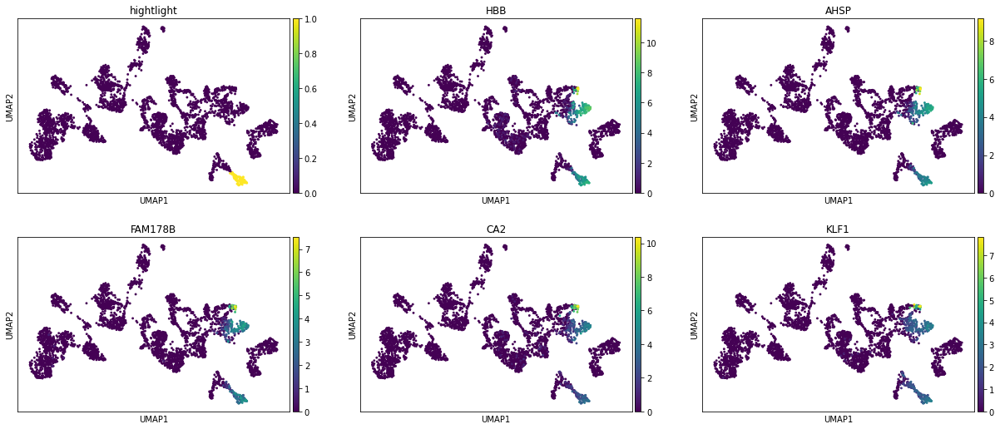

23


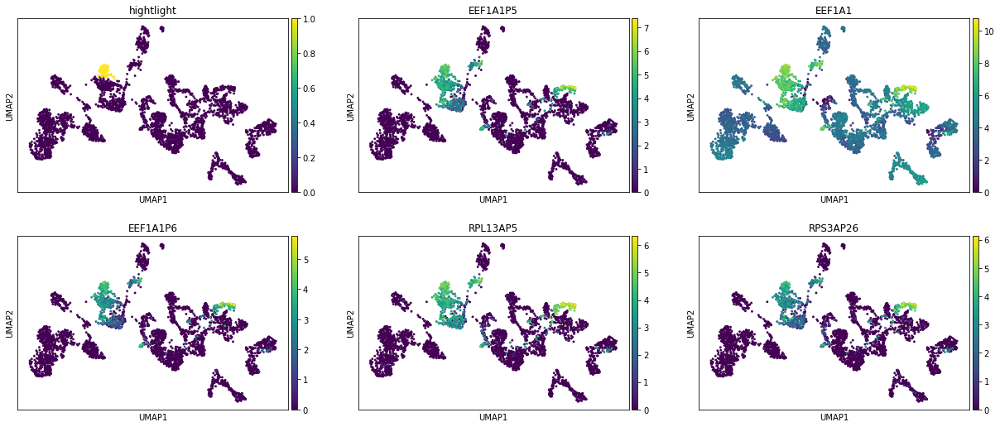

24


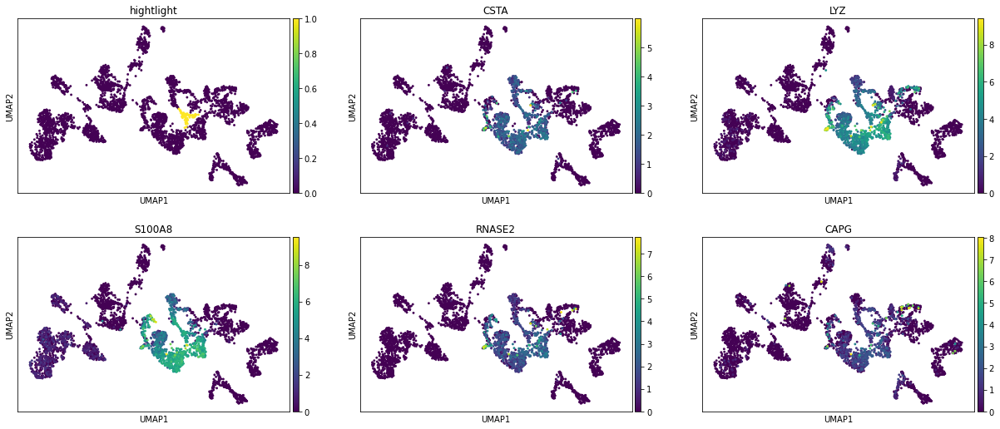

25


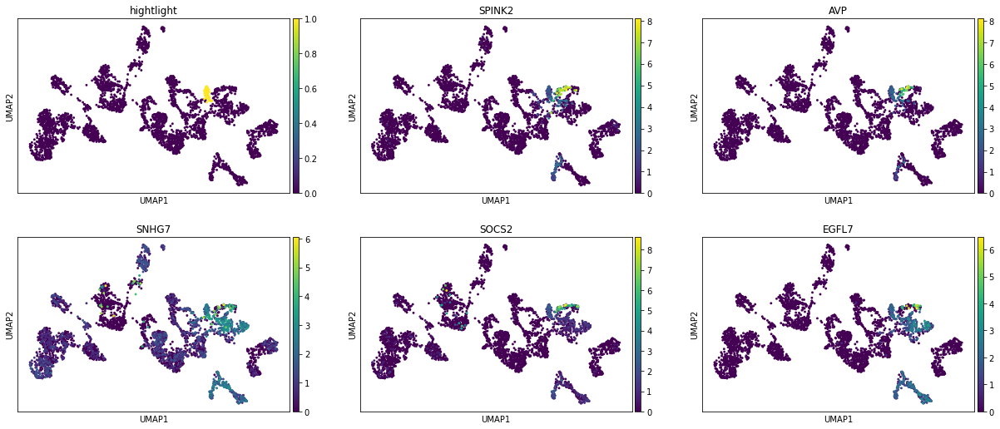

26


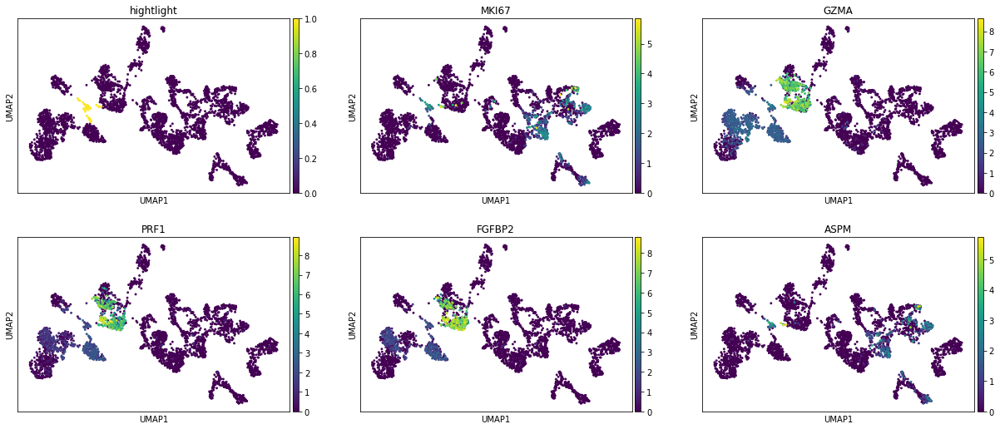

27


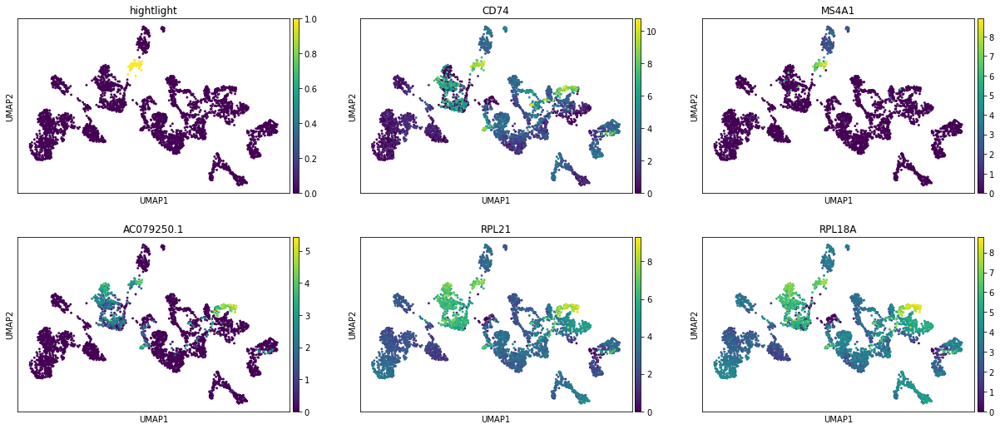

28


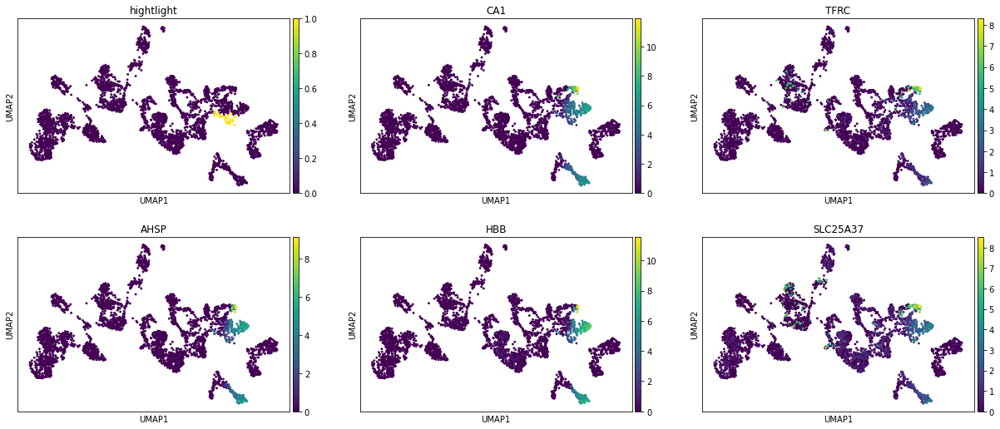

29


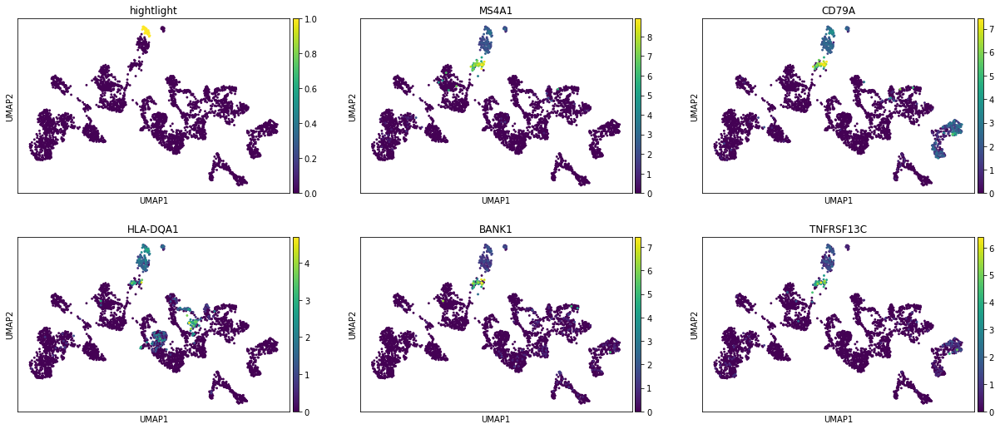

30


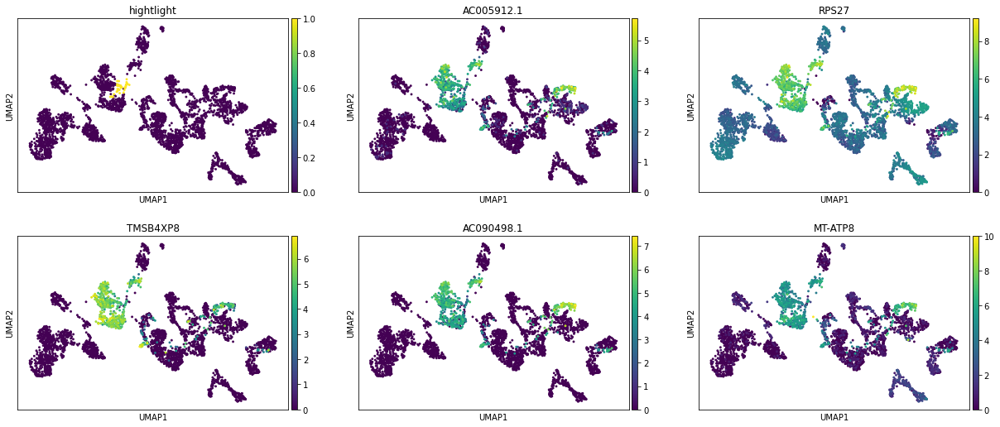

31


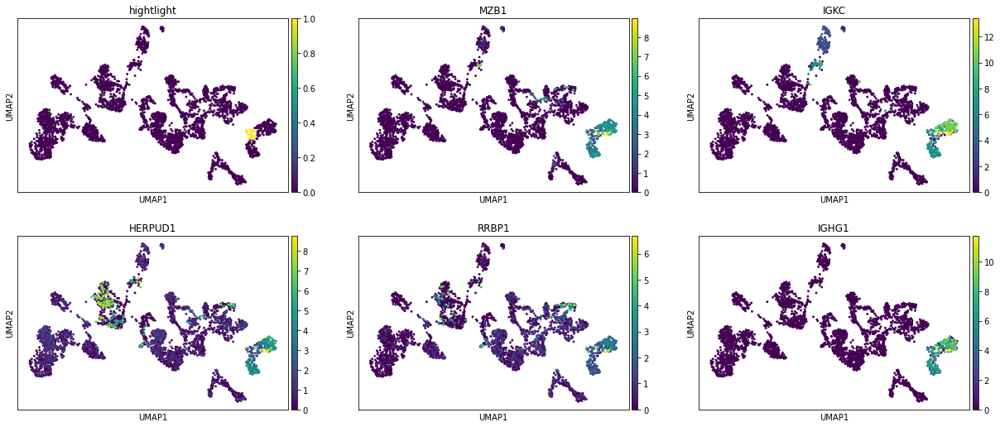

32


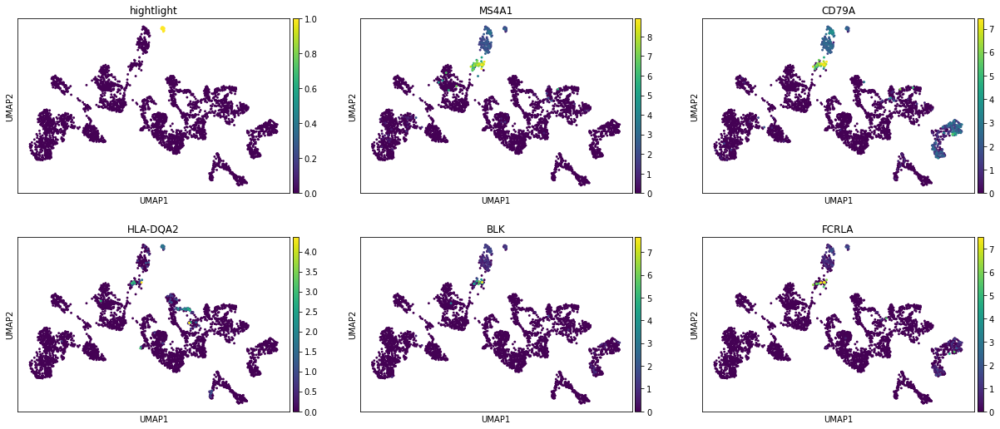

In [25]:
for x in DE.keys():
    print(x)
    topgenes = list(DE[x].T[:5].index)
    organ_adata.obs["hightlight"] = organ_adata.obs["leiden"] == x
    sc.pl.umap(
        organ_adata,
        color=["hightlight"] + topgenes,
        ncols=3,
    )

### The extended DE list can be queried by 

In [26]:
DE["0"].T

,wilcoxon_score,log fold change,adjusted pvalue
CD3E,20.258535,2.961724,1.758577e-86
LTB,19.989702,3.109789,1.992736e-84
IL7R,19.878288,3.338770,1.231150e-83
TRAC,19.670971,2.418397,5.627856e-82
CD3D,19.235001,2.287688,2.219884e-78
...,...,...,...
PSAP,-13.734810,-3.644209,1.681028e-39
MTATP6P1,-13.894471,-3.530220,1.918235e-40
GSTP1,-14.499042,-3.404930,4.821562e-44
MT-CO2,-14.855835,-2.329817,2.887726e-46


# read in cell ontology 

In [27]:
import obonet

ont_dir = "/data/yosef2/users/chenling/TabulaSapiensData/ontology/"
obo = ont_dir + "cl.obo.txt"
f = open(obo, "r")
co = obonet.read_obo(f)
f.close()

celltype_dict = {}
for x in co.nodes:
    celltype_dict[co.nodes[x]['name']] = x



You can look up all T cell by typing celltype_dict['T'] and using tab complete  

In [28]:
celltype_dict['T cell']

'CL:0000084'

You can also look at the names of all subsets of T cell that contains 'CD4' in their names

In [29]:
import networkx as nx


def PrintChildren(co, parent, pattern=""):
    all_children = [x for x in nx.ancestors(co, celltype_dict[parent])]
    return [co.nodes[x]["name"] for x in all_children if pattern in co.nodes[x]["name"]]


PrintChildren(co, "T cell", "CD4")

['activated CD4-positive, alpha-beta T cell',
 'CD4-positive, alpha-beta cytotoxic T cell',
 'activated CD4-positive, alpha-beta T cell, human',
 'activated CD4-positive type I NK T cell',
 'CD69-positive, CD4-positive single-positive thymocyte',
 'CD4-positive, CD25-positive, alpha-beta regulatory T cell',
 'CD4-positive, CD25-positive, CCR4-positive, alpha-beta regulatory T cell',
 'CD4-positive, alpha-beta memory T cell',
 'CD4-negative CD8-negative gamma-delta intraepithelial T cell',
 'CD4-positive, CXCR3-negative, CCR6-negative, alpha-beta T cell',
 'CD4-negative, CD8-negative type I NK T cell secreting interferon-gamma',
 'CD4-negative, CD8-negative type I NK T cell',
 'CD4-positive, CD8-intermediate double-positive thymocyte',
 'CD24-positive, CD4 single-positive thymocyte',
 'CD2-positive, CD5-positive, CD44-positive alpha-beta intraepithelial T cell',
 'CD4-positive helper T cell',
 'central memory CD4-positive, alpha-beta T cell',
 'effector memory CD4-positive, alpha-beta T

# manually create mapping between cluster and cell type (this is just an example), and the relevant marker genes that was used to generate this prediction

In [30]:
organ_adata.obs["annotation_oct2020"] = organ_adata.obs["leiden"].copy()
cluster_mapping = {"0": "T cell"}
cluster_markers = {"0": ["CXCR4", "CD3D", "IL7R", "IL32"]}

This cell will automatically replace the leiden cluster names with cell type annotations

In [31]:
for l in cluster_mapping.keys():
    organ_adata.obs["annotation_oct2020"].replace(l, cluster_mapping[l], inplace=True)
    display(DE[l][cluster_markers[l]])

,CXCR4,CD3D,IL7R,IL32
wilcoxon_score,6.783868e+00,1.923500e+01,1.987829e+01,1.758241e+01
log fold change,-3.256381e-01,2.287688e+00,3.338770e+00,2.382239e+00
adjusted pvalue,2.799927e-09,2.219884e-78,1.231150e-83,2.472260e-65


# Visualize the results of the manual annotation

/data/yosef2/users/chenling/miniconda3/envs/scvi-tools/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning:

is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead



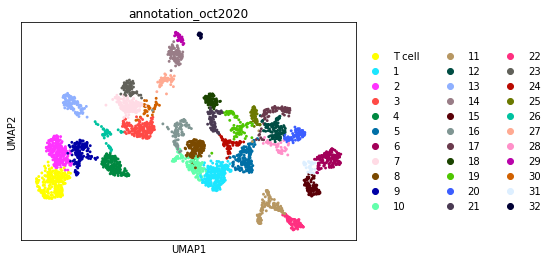

In [32]:
sc.pl.umap(
    organ_adata,
    color=["annotation_oct2020"],
    ncols=3,
)

# manually create mapping between cell type and compartment (this is just an example)

In [33]:
organ_adata.obs["compartment_oct2020"] = organ_adata.obs["annotation_oct2020"].copy()
compartment_mapping = {"T cell": "Immune"}

This cell will automatically replace the leiden cluster names with cell type annotations

In [34]:
for c in compartment_mapping.keys():
    organ_adata.obs["compartment_oct2020"].replace(
        c, compartment_mapping[c], inplace=True
    )

# Visualize the results of the new compartment splitting

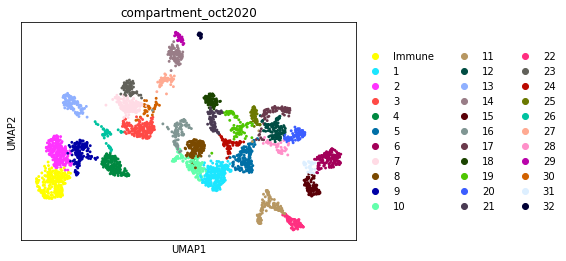

In [35]:
sc.pl.umap(
    organ_adata,
    color=["compartment_oct2020"],
    ncols=3,
)

# save data

In [36]:
organ_adata.write_h5ad(
    data_path + "decontX/organ_data/Pilot1_Pilot2.decontX.%s.h5ad" % organ
)